# Importar Dados

In [223]:
diretorio = r'C:\Users\victor\Desktop\lab voz python'
from python_speech_features import mfcc
from python_speech_features import delta
from python_speech_features import logfbank
import scipy.io.wavfile as wav
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
from itertools import combinations
from matplotlib import cm
plt.rcParams['figure.figsize'] = (14,4)

In [120]:
#achar arquivos de audio dentro da pasta, importar wav
import os
audios = [] #audios contidos na pasta
for dirpath, dnames, fnames in os.walk(diretorio):
    for f in fnames:
        if f.endswith(".wav"):
            audio_name = (os.path.join(dirpath, f))
            audios.append([audio_name, audio_name.split('\\')[-1]])

In [122]:
audios = np.array(audios)
audios = np.c_[audios,['Ale','Ale','Victor','Victor']] ## ad coluna com nome de quem fez o áudio

In [242]:
pd.DataFrame(audios)

,0,1,2
0,C:\Users\victor\Desktop\lab voz python\Falar C...,Falar Cantar.wav,Ale
1,C:\Users\victor\Desktop\lab voz python\Realmen...,Realmente.wav,Ale
2,C:\Users\victor\Desktop\lab voz python\Serenat...,Serenata.wav,Victor
3,C:\Users\victor\Desktop\lab voz python\Vambora...,Vambora.wav,Victor


In [556]:
audios[1,0]

'C:\\Users\\victor\\Desktop\\lab voz python\\Realmente.wav'

## visualizar Sinal de voz

Falar Cantar.wav Autor: Ale


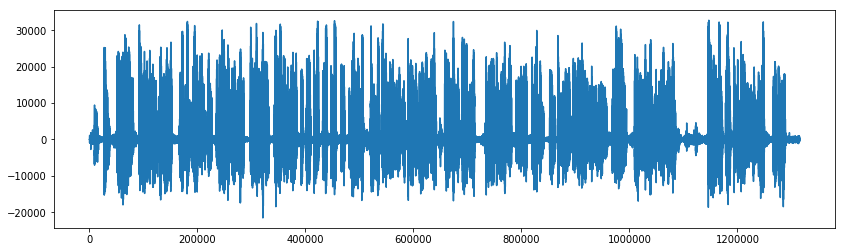

Realmente.wav Autor: Ale


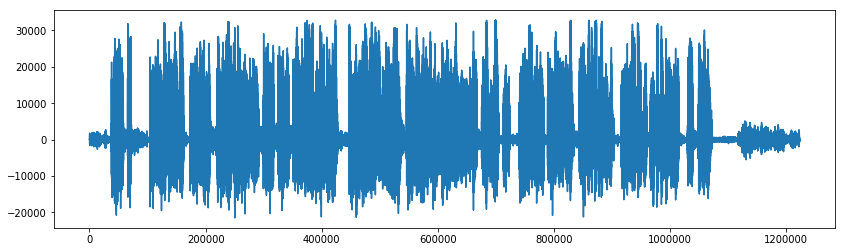

Serenata.wav Autor: Victor


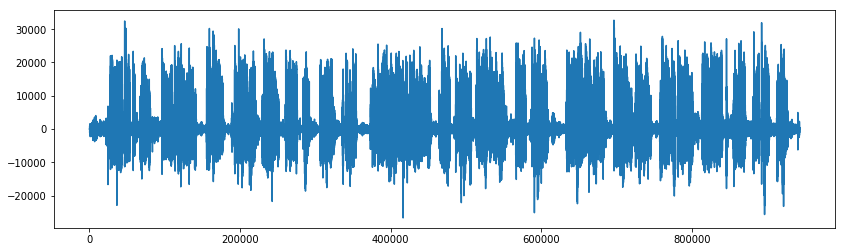

Vambora.wav Autor: Victor


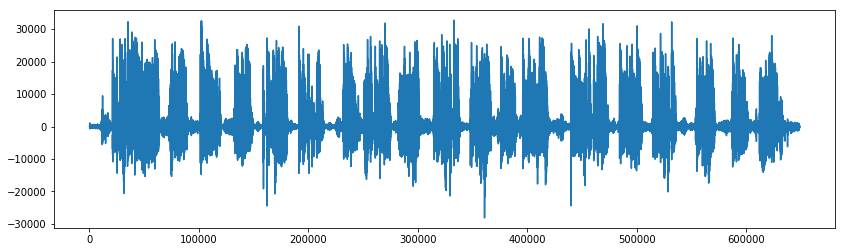

In [558]:
import IPython.display as ipd
for i in range(len(audios)):
    print(audios[i][1],'Autor: '+audios[i][2], )
    plt.plot(wav.read(audios[i,0])[1])
    plt.show()

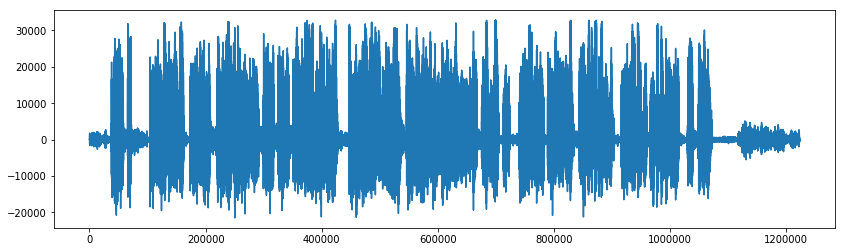

In [253]:
audios[0,1]

'Falar Cantar.wav'

In [152]:
import IPython.display as ipd
for i in range(len(audios)):
    print(audios[i][1],'Autor: '+audios[i][2], )
    a = ipd.Audio(data = audios[i][0])
    display(a)

Falar Cantar.wav Autor: Ale


Realmente.wav Autor: Ale


Serenata.wav Autor: Victor


Vambora.wav Autor: Victor


# Calcular MFCC
Parametros para serem utilizados para calcular mfcc  
Tw = 32 ms;  
ii. Ts = 16 ms;  
iii. Alpha = 0.95;  
iv. M = 30 canais;  
v. C = 18 coeficientes cepstrais;  
vi. L = 22;  
vii. LF = 200 Hz;  
viii. HF = 5 kHz;  

In [229]:
def mfcc_minami(sig, rate):
    return  mfcc(
    signal = sig,
    samplerate=rate,
    winlen=0.032,
    winstep=0.016,
    numcep=18,
    nfilt=26,
    nfft=512,
    lowfreq=200,
    highfreq=5000,
    preemph=0.95,
    ceplifter=22,
    winfunc=np.hamming,
    appendEnergy=False)

In [236]:
#Ajustar escala dos mffcs
# import sklearn
# mfccs = sklearn.preprocessing.scale(mfcc_ex, axis=1)
# print (mfccs.mean(axis=1))
# print (mfccs.var(axis=1))

In [278]:
def plot_mfcc(mfccs):
    mfcc_feat = mfccs

    ig, ax = plt.subplots()
    mfcc_data= np.swapaxes(mfcc_feat, 0 ,1)
    cax = plt.imshow(mfcc_data, interpolation='nearest', cmap=cm.coolwarm, origin='lower', aspect='auto')
    ax.set_title('MFCC')
    #Showing mfcc_data

    plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
    cax = plt.axes([0.85, 0.1, 0.075, 0.8])
    plt.colorbar(cax=cax)

    plt.show()
    #Showing mfcc_feat
    plt.plot(mfcc_feat)
    plt.show()

In [285]:
def plot_hist(dataset):
    fig, axes = plt.subplots(len(dataset.columns)//3, 3, figsize=(12, 48))
    i = 0
    for triaxis in axes:
        for axis in triaxis:
            dataset.hist(column = dataset.columns[i], bins = 20, ax=axis)
            i = i+1
    plt.show()       

# MFCCs e Histogramas de cada coeficiente cepstral

In [326]:
mfccs_dict_pd = {}
mfccs_dict = {}

Falar Cantar.wav Autor: Ale


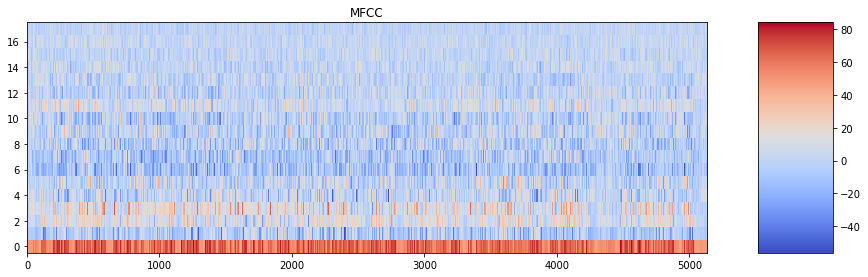

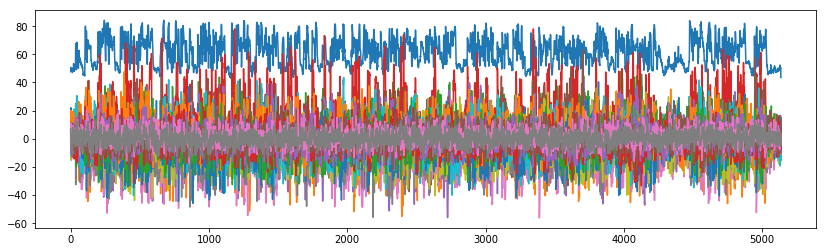

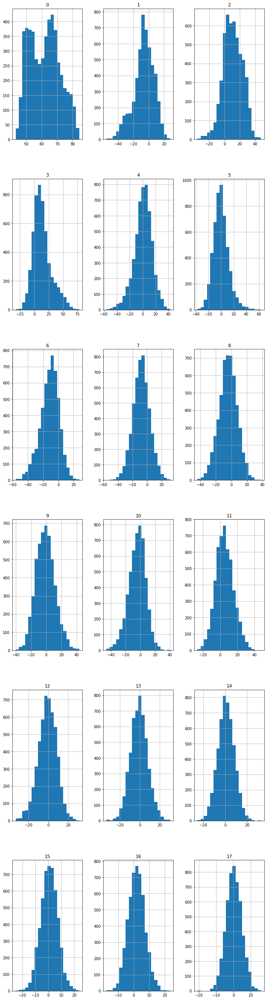

Realmente.wav Autor: Ale


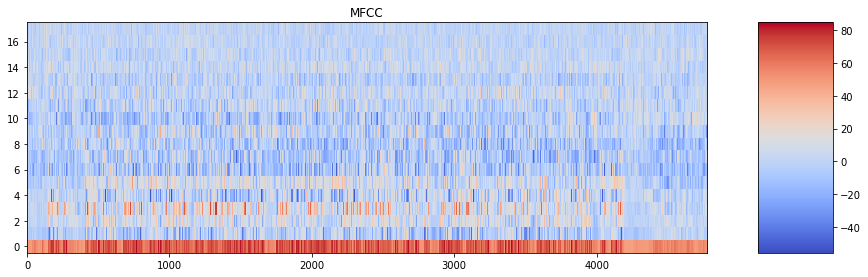

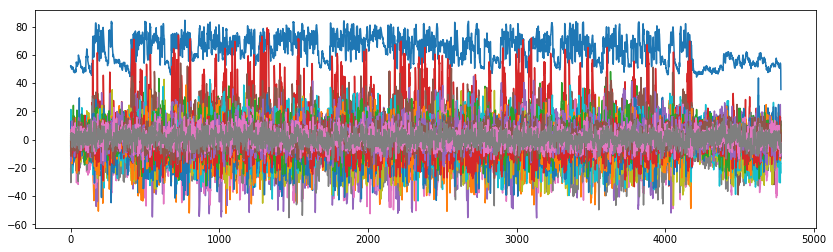

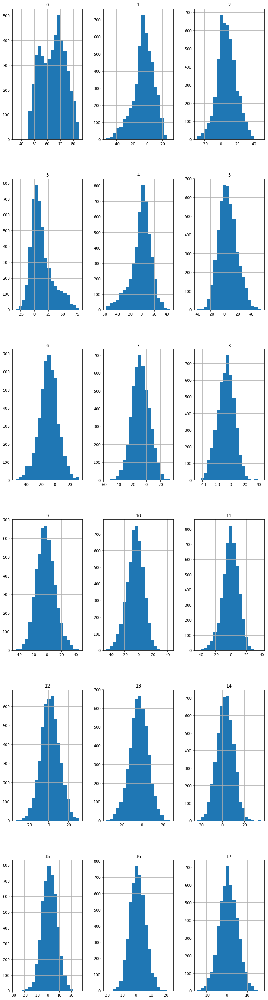

Serenata.wav Autor: Victor


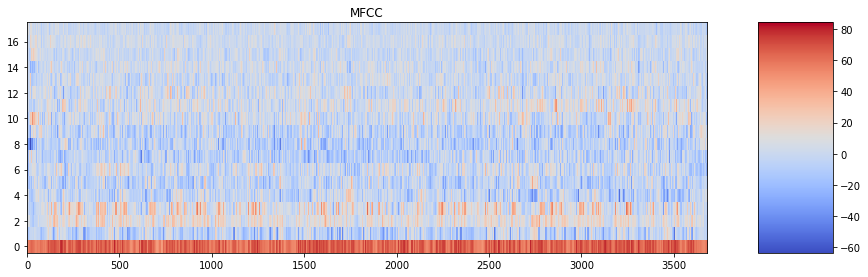

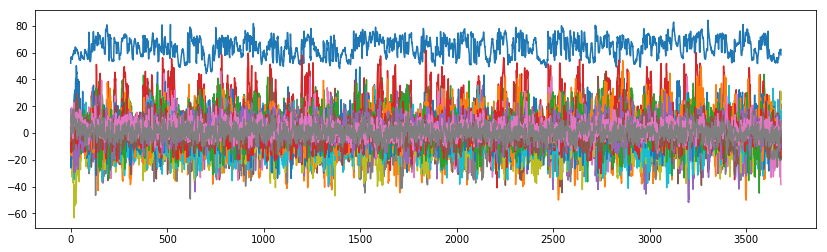

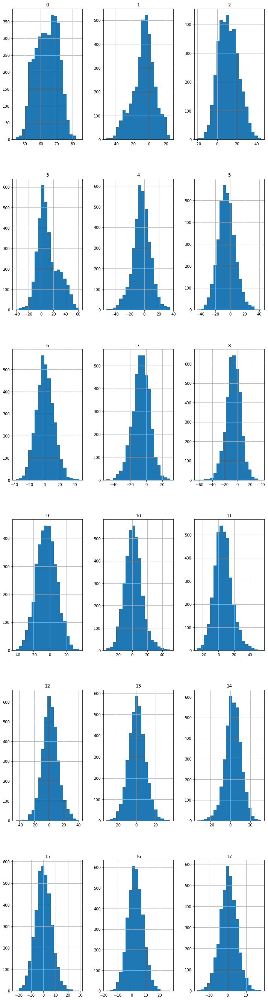

Vambora.wav Autor: Victor


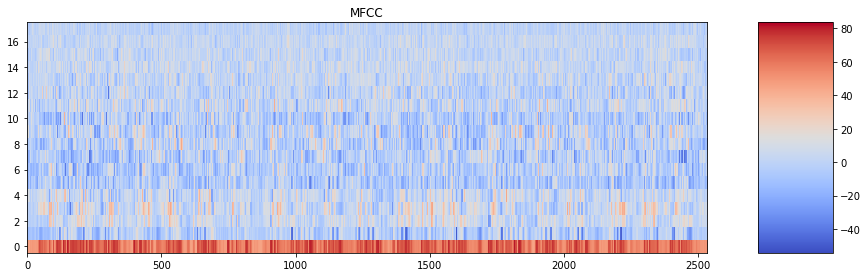

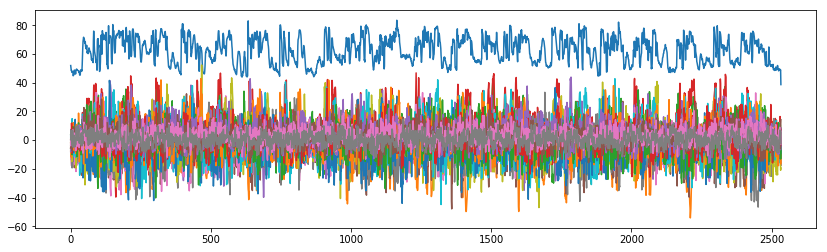

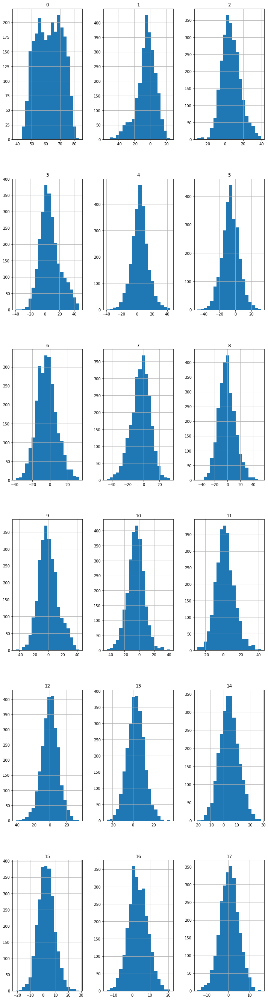

In [328]:
dict = {}
for i in range(len(audios)):
    print(audios[i][1],'Autor: '+audios[i][2] )
    (rate,sig) = wav.read(audios[i,0])
    mfcc_ex = mfcc_minami(sig,rate) #captruar mfccs
    mfccs_dict[audios[i][1]] = mfcc_ex
        
    mfcc_dataset = pd.DataFrame(mfcc_ex) #tranformar em dataset
    mfccs_dict_pd[audios[i][1]] = mfcc_dataset
    plot_mfcc(mfcc_ex)
    plot_hist(mfcc_dataset)

# VQ

## a. 
Escolha um conjunto de MFCCs de poesia e outro de texto discursivo

In [442]:
mfcc_discursivo = mfccs_dict['Realmente.wav']
mfcc_poesia = mfccs_dict['Vambora.wav']
mfcc_discursivo_teste = mfccs_dict['Falar Cantar.wav']
mfcc_poesia_teste = mfccs_dict['Serenata.wav']

 ## b. 
 Efetue o treino de quantização vetorial de todos os coeficientes dos arquivos, gerando os codebooks, para L = 32, 64, 128, 256 e 512 níveis, sendo que em cada valor de L, plote a ocupação dos níveis p.

In [560]:
import lbg

In [ ]:
L = [32,64,128,256,512]

In [330]:
dataset = mfcc_discursivo
dataset.shape

(4778, 18)

In [390]:
P = []
for i in L:
    codebook = lbg.generate_codebook(testdata, i, epsilon=0.01)
    P.append(np.mean(codebook[2]))

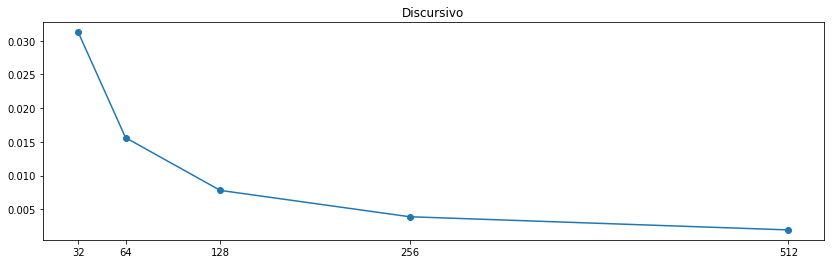

In [403]:
plt.plot(L,P,'-o')
plt.xticks(L)
plt.title('Discursivo')
plt.show()

In [405]:
dataset = mfcc_poesia
dataset.shape

(2534, 18)

In [406]:
P = []
for i in L:
    codebook = lbg.generate_codebook(testdata, i, epsilon=0.01)
    P.append(np.mean(codebook[2]))

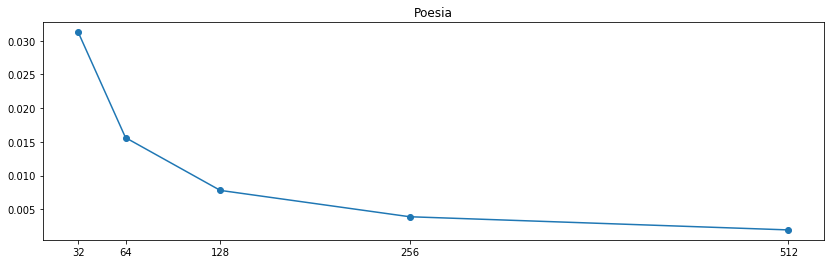

In [408]:
plt.plot(L,P,'-o')
plt.xticks(L)
plt.title('Poesia')
plt.show()

### Discussão:
A partir do gráfico P vs L para o áudio discursivo, é possível supor que o nível 128 é a melhor escolha, uma vez que a redução da ocupação dos níveis deixa de ser drástica  após este valor. O mesmo ocorre para o Áudio de poesia com o melhor valor de 128 níveis. Os gráficos tanto para poesia quanto para discursivo resultou em curvas bem semelhantes este resultado é esperado uma vez que o áudio foi gravado com o mesmo dispositivo, no caso um celular. 

## Para Casa
c. Para Casa:
i. Projete dois quantizador vetoriais, um de poesia e outro de texto discursivo com os
codebooks treinados (escolha um L), justificando sua escolha. Guarde a distorção
total da quantização em cada caso.
ii. quantize tanto os MFCCs usados para treino como o outro MFCCs (poesia e texto).
Compare as distorções totais finais.


In [411]:
#treino
dataset_dis = mfcc_discursivo
codebook_dis = lbg.generate_codebook(dataset_dis, 128, epsilon=0.01)
dataset_poesia = mfcc_poesia
codebook_poesia = lbg.generate_codebook(dataset_poesia, 128, epsilon=0.01)

In [441]:
distorcao_dis = lbg.avg_distortion_c_list(codebook_dis[0],dataset_dis)
distorcao_poesia = lbg.avg_distortion_c_list(codebook_poesia[0],dataset_poesia)  
print('Distorção no treino para Poesia {:.2f}\nDistorção no treino para Discursivo {:.2f}'.format(distorcao_poesia,distorcao_dis))

Distorção no treino para Poesia 170.14
Distorção no treino para Discursivo 153.14


In [446]:
#teste
dataset_poesia_teste = mfcc_poesia_teste
dataset_discursivo_teste = mfcc_discursivo_teste

distorcao_dis_teste = lbg.avg_distortion_c_list(codebook_dis[0],dataset_discursivo_teste)
distorcao_poesia_teste = lbg.avg_distortion_c_list(codebook_poesia[0],dataset_poesia_teste)  
print('Distorção no treino para Poesia {:.2f}\nDistorção no treino para Discursivo {:.2f}'.format(distorcao_poesia_teste,distorcao_dis_teste))

Distorção no treino para Poesia 199.19
Distorção no treino para Discursivo 190.32


###  Discussão  
A diferença de distorção de treino para teste foi percebida, em ambos os áudios. Os Áudios discursivos apresentaram maior diferença na distorção, porém menor distorção tanto no treino quanto no teste. Como os dados não foram em grandes quantidades, e não a voz de cada aluno também foi diferente entre discursivo e poesia as medidas de distorção ser pouco precisas para determinar se esta diferença é em razão da voz do aluno ou do a forma com que foi lido os textos.


# GMM

## a. 
Obtenha as GMMs para um conjunto de MFCCs de poesia e outro de texto discursivo.

## b. 
Estime o número de misturas pelos histogramas pelo item 3b

In [550]:
from sklearn.mixture import GaussianMixture
gmm_poesia = GaussianMixture(n_components = 19, covariance_type='diag',n_init = 3, random_state=0)
gmm_dis = GaussianMixture(n_components = 19, covariance_type='diag',n_init = 3, random_state=0)

In [551]:
#gmm.fit(features)

#treino
dataset_dis = mfcc_discursivo
gmm_dis = gmm_dis.fit(dataset_dis)
dataset_poesia = mfcc_poesia
gmm_poesia = gmm_poesia.fit(dataset_poesia)

In [552]:
#teste
dataset_poesia_teste = mfcc_poesia_teste
dataset_discursivo_teste = mfcc_discursivo_teste

distorcao_dis_teste = gmm_dis.score(dataset_discursivo_teste)
distorcao_poesia_teste = gmm_poesia.score(dataset_poesia_teste)  
print('Distorção no treino para Poesia {:.2f}\nDistorção no treino para Discursivo {:.2f}'.format(distorcao_poesia_teste,distorcao_dis_teste))

Distorção no treino para Poesia -67.11
Distorção no treino para Discursivo -65.67


## Discussão:
Foram utilizados os histogramas do exercício 3b para determinar o numero de gaussianas do GMM. Para medir a eficiência da quantização, foi utilizado a medida de log-verossimilhança e obtivemos melhor resultado para os áudios discursivos.